In [9]:
%load_ext tensorboard

In [1]:
#imports
import cv2, os
import numpy as np 
import tensorflow as tf
from tensorflow.keras.utils import Sequence
from PIL import Image
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model,load_model
import pandas as pd
import tensorflow.keras.backend as K
from matplotlib import pyplot as plt
from efficientnet import tfkeras as efn
from tensorflow.keras.utils import plot_model
import tensorboard

In [2]:
#ious
def iou(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

In [3]:
stride = 2
def build_fpn(features,num_channels,wbifpn,kernel_size=2):
    p4,p5,p6,p7 = features
    #column1
    p6 = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p6)
    p5 = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p5)
    p4 = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p4)
    
    p7 = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p7)
    p7_resize = BatchNormalization()(p7)
    p7_resize = MaxPool2D((kernel_size,kernel_size))(p7_resize)
    if wbifpn:
        p6_td = Fuse()([p6,p7_resize])
    else:
        p6_td = Add()([p6,p7_resize])
    p6_td = Conv2D(num_channels,(3,3),kernel_initializer = 'glorot_uniform',activation='relu',padding='same')(p6_td)
    p6_td = BatchNormalization()(p6_td)
    p6_td = MaxPool2D((2,2),padding = 'same',strides = 1)(p6_td)
    p6_td_resize = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p6_td)
    p6_td_resize = BatchNormalization()(p6_td_resize)
    
    p6_td_resize = MaxPool2D((kernel_size,kernel_size))(p6_td_resize) 
    if wbifpn:
        p5_td = Fuse()([p5,p6_td_resize])
    else:
        p5_td = Add()([p5,p6_td_resize])
    p5_td = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p5_td)
    p5_td = BatchNormalization()(p5_td)
    p5_td = MaxPool2D((2,2),padding='same',strides = 1)(p5_td)
    p5_td_resize = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p5_td)
    p5_td_resize = BatchNormalization()(p5_td_resize)
    p5_td_resize = MaxPooling2D((kernel_size,kernel_size))(p5_td_resize)
    if wbifpn:
        p4_td = Fuse()([p4,p5_td_resize])
    else:
        p4_td = Add()([p4,p5_td_resize])
    p4_td = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p4_td)
    p4_td = MaxPool2D((2,2),padding='same',strides = 1)(p4_td)
    p4_U = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p4_td)
    p4_U = BatchNormalization()(p4_U)
    p5_U = UpSampling2D((kernel_size,kernel_size))(p4_U)
    if wbifpn:
        p5_U = Fuse()([p5,p5_td,p5_U])
    else:
        p5_U = Add()([p5,p5_td,p5_U])
    p5_U = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p5_U)
    p5_U = BatchNormalization()(p5_U)
    p6_U = UpSampling2D((kernel_size,kernel_size))(p5_U)
    if wbifpn:
        p6_U = Fuse()([p6,p6_td,p6_U])
    else:
        p6_U = Add()([p6,p6_td,p6_U])
    p6_U = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p6_U)
    p6_U = BatchNormalization()(p6_U)
    p7_U = UpSampling2D((kernel_size,kernel_size))(p6_U)
    if wbifpn:
        p7_U = Fuse()([p7,p7_U])
    else:
        p7_U = Add()([p7,p7_U])
    p7_U = Conv2D(num_channels,(3,3),kernel_initializer='glorot_uniform',activation='relu',padding='same')(p7_U)
    p7_U = BatchNormalization()(p7_U)
    return (p4_U,p5_U,p6_U,p7_U)

class Fuse(tf.keras.layers.Layer):
    '''Fusion layer'''
    def __init__(self, epsilon=1e-4, **kwargs):
        super(Fuse, self).__init__(**kwargs)
        self.epsilon = epsilon

    def build(self, input_shape):
        num_in = len(input_shape)
        self.w = self.add_weight(name=self.name,
                                 shape=(num_in,),
                                 initializer=tf.keras.initializers.constant(1 / num_in),
                                 trainable=True,
                                 dtype=tf.float32)

    def call(self, inputs, **kwargs):
        w = tf.keras.activations.relu(self.w)
        x = tf.reduce_sum([w[i] * inputs[i] for i in range(len(inputs))], axis=0)
        x = x / (tf.reduce_sum(w) + self.epsilon)
        return x
    def compute_output_shape(self, input_shape):
        return input_shape[0]

    def get_config(self):
        config = super(Fuse, self).get_config()
        config.update({
            'epsilon': self.epsilon
        })
        return config
    
def create_model(input_shape ,c,wbifpn=False):
    '''model'''
    c1,c2,c3,c4=c[0],c[1],c[2],c[3]
    effnet = efn.EfficientNetB4(input_shape=input_shape,weights=None,include_top = False)
    p4 = effnet.get_layer('block2a_activation').output
    p5 = effnet.get_layer('block3a_activation').output
    p6 = effnet.get_layer('block4a_activation').output
    p7 = effnet.get_layer('block7a_activation').output
    features = (p7,p6,p5,p4)
    features = build_fpn(features,c1,wbifpn)
    features = build_fpn(features,c2,wbifpn)
    features = build_fpn(features,c3,wbifpn)
    features = build_fpn(features,c4,wbifpn)
    features = list(features)
    for i in range(1,4):
        feature_curr = features[i]
        feature_past = features[i-1]
        feature_past_up = UpSampling2D((2,2))(feature_past)
        feature_past_up = Conv2D(c4,(3,3),padding='same',activation='relu',kernel_initializer='glorot_uniform')(feature_past_up)
        if wbifpn:
            feature_final = Fuse(name='final{}'.format(str(i)))([feature_curr,feature_past_up])
        else:
            feature_final = Add(name='final{}'.format(str(i)))([feature_curr,feature_past_up])
        features[i] = feature_final
    if stride == 2:
        features[-1] = UpSampling2D((2,2))(features[-1])
        features[-1] = Conv2D(128,(3,3),activation='relu',padding='same',kernel_initializer='glorot_uniform')(features[-1])
    out = Conv2D(5,(3,3),activation='sigmoid',kernel_initializer='glorot_uniform',padding='same')(features[-1])
    zeros = tf.expand_dims(tf.zeros_like(out[...,0]),axis=-1)
    out_concat = tf.concat([zeros,out],axis = -1)
    prediction_model=tf.keras.models.Model(inputs=[effnet.input],outputs=out)
    model = Model(inputs = [effnet.input],outputs = out_concat)

    return model,prediction_model
model,_ = create_model((512,512,3),c=[8,16,32,64])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
stem_conv (Conv2D)              (None, 256, 256, 48) 1296        input_1[0][0]                    
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (None, 256, 256, 48) 192         stem_conv[0][0]                  
__________________________________________________________________________________________________
stem_activation (Activation)    (None, 256, 256, 48) 0           stem_bn[0][0]                    
____________________________________________________________________________________________

In [4]:
def _ctdet_decode(hm, reg, wh, k=20, output_stride=2):
    bboxes = []
    scores = []
    hm = K.eval(_nms(tf.cast(hm,tf.float32)))
    hm = hm[0,:,:,0]
    w = hm.shape[1]
    hm_ = np.zeros_like(hm)
    hm_flat = hm.reshape(-1)
    for i in range(k):
        m = np.argmax(hm_flat)
        hm_[m//w][m%w] = hm_flat[m]
        hm_flat[m] = -1
    points = np.argwhere(hm_[:,:]!=0)
    
    for (y,x) in points:
        score = hm_[y,x]
        offy = reg[0,y,x,0]
        offx = reg[0,y,x,1]
        height = wh[0,y,x,0]*output_size
        width = wh[0,y,x,1]*output_size
        xc = x+offx
        yc = y+offy
        xmin = int((xc-(width/2)))
        ymin = int((yc-(height/2)))
        xmax = int((xc+(width/2)))
        ymax = int((yc+(height/2)))
        bboxes.append([xmin,ymin,xmax,ymax])
        scores.append(score)
    return scores,bboxes
def _nms(heat, kernel=5):
    hmax = K.pool2d(heat, (kernel, kernel), padding='same', pool_mode='max')

    keep = K.cast(K.equal(hmax, heat), K.floatx())
    return heat * keep
def NMS_all(predicts,category_n, pred_out_h, pred_out_w, score_thresh,iou_thresh):
    y_c=predicts[...,category_n]+np.arange(pred_out_h).reshape(-1,1)
    x_c=predicts[...,category_n+1]+np.arange(pred_out_w).reshape(1,-1)
    height=predicts[...,category_n+2]*pred_out_h
    width=predicts[...,category_n+3]*pred_out_w

    count=0
    for category in range(category_n):
        predict=predicts[...,category]
        mask=(predict>score_thresh)
        
        if mask.all==False:
            continue
        box_and_score=NMS(predict[mask],y_c[mask],x_c[mask],height[mask],width[mask],iou_thresh,pred_out_h, pred_out_w)
        box_and_score=np.insert(box_and_score,0,category,axis=1)#category,score,top,left,bottom,right
        if count==0:
            box_and_score_all=box_and_score
        else:
            box_and_score_all=np.concatenate((box_and_score_all,box_and_score),axis=0)
        count+=1
    score_sort=np.argsort(box_and_score_all[:,1])[::-1]
    box_and_score_all=box_and_score_all[score_sort]


    _,unique_idx=np.unique(box_and_score_all[:,2],return_index=True)
  
    return box_and_score_all[sorted(unique_idx)]
  
def NMS(score,y_c,x_c,height,width,iou_thresh,pred_out_h, pred_out_w,merge_mode=False):
    if merge_mode:
        score=score
        top=y_c
        left=x_c
        bottom=height
        right=width
    else:
        #flatten
        score=score.reshape(-1)
        y_c=y_c.reshape(-1)
        x_c=x_c.reshape(-1)
        height=height.reshape(-1)
        width=width.reshape(-1)
        size=height*width


        top=y_c-height/2
        left=x_c-width/2
        bottom=y_c+height/2
        right=x_c+width/2

        inside_pic=(top>0)*(left>0)*(bottom<pred_out_h)*(right<pred_out_w)
        outside_pic=len(inside_pic)-np.sum(inside_pic)

        normal_size=(size<(np.mean(size)*20))*(size>(np.mean(size)/20))
        score=score[inside_pic*normal_size]
        top=top[inside_pic*normal_size]
        left=left[inside_pic*normal_size]
        bottom=bottom[inside_pic*normal_size]
        right=right[inside_pic*normal_size]
  

    

  #sort  
    score_sort=np.argsort(score)[::-1]
    score=score[score_sort]  
    top=top[score_sort]
    left=left[score_sort]
    bottom=bottom[score_sort]
    right=right[score_sort]

    area=((bottom-top)*(right-left))

    boxes=np.concatenate((score.reshape(-1,1),top.reshape(-1,1),left.reshape(-1,1),bottom.reshape(-1,1),right.reshape(-1,1)),axis=1)

    box_idx=np.arange(len(top))
    alive_box=[]
    while len(box_idx)>0:
  
        alive_box.append(box_idx[0])

        y1=np.maximum(top[0],top)
        x1=np.maximum(left[0],left)
        y2=np.minimum(bottom[0],bottom)
        x2=np.minimum(right[0],right)

        cross_h=np.maximum(0,y2-y1)
        cross_w=np.maximum(0,x2-x1)
        still_alive=(((cross_h*cross_w)/area[0])<iou_thresh)
        if np.sum(still_alive)==len(box_idx):
            print("error")
            print(np.max((cross_h*cross_w)),area[0])
        top=top[still_alive]
        left=left[still_alive]
        bottom=bottom[still_alive]
        right=right[still_alive]
        area=area[still_alive]
        box_idx=box_idx[still_alive]
    return boxes[alive_box]#score,top,left,bottom,right

def visualize(box_and_score,img):
    boxes = []
    scores = []
    colors= [(0,0,255), (255,0,0), (0,255,255), (0,127,127), (127,255,127), (255,255,0)]
    classes = ["car", "motor", "person", "bus", "truck", "bike"]
    number_of_rect=np.minimum(500,len(box_and_score))

    for i in reversed(list(range(number_of_rect))):
        predicted_class, score, top, left, bottom, right = box_and_score[i,:]


        top = np.floor(top + 0.5).astype('int32')
        left = np.floor(left + 0.5).astype('int32')
        bottom = np.floor(bottom + 0.5).astype('int32')
        right = np.floor(right + 0.5).astype('int32')

        predicted_class = int(predicted_class)

        label = '{:.2f}'.format(score)

        cv2.rectangle(img, (left, top), (right, bottom), colors[predicted_class], 3)
        cv2.putText(img, label, (left, top), cv2.FONT_HERSHEY_SIMPLEX ,  
                       0.5, (255,255,255), 2, cv2.LINE_AA) 
        boxes.append([left, top, right-left, bottom-top])
        scores.append(score)
    
    return np.array(boxes), np.array(scores)




In [5]:
tsv1 = '/home/b170007ec/Type_1_bbox.tsv'
tsv2 = '/home/b170007ec/Type_2_bboxes.tsv'
tsv3 = '/home/b170007ec/Type_3_bbox.tsv'
tsv1 = pd.read_csv(tsv1,sep='/t',header=None,names=['bboxes'])
tsv2 = pd.read_csv(tsv2,sep='/t',header=None,names=['bboxes'])
tsv3 = pd.read_csv(tsv3,sep='/t',header=None,names=['bboxes'])
input_size = 512
bboxes = []
img_dirs = []
for i,tsv in enumerate([tsv1,tsv2,tsv3]):
    for k in range(tsv.shape[0]):
        string = tsv.iloc[k].to_list()[0][7:]
        string = string.split(' ')
        img_dir = '/home/b170007ec/Datasets/Cervix Cancer/train/train/Type_'+str(i+1)+'/'+string[0]
        bbox = string[2:6]
        for l in range(4):
            bbox[l] = int(bbox[l])
        img_dirs.append(img_dir)
        bboxes.append(bbox)
print(len(img_dirs))
img_dirs = img_dirs[:100]
bboxes = bboxes[:100]
pred_out_h=int(input_size/stride)
pred_out_w=int(input_size/stride)




1466


/home/b170007ec/.conda/envs/AIR/lib/python3.7/site-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.
/home/b170007ec/.conda/envs/AIR/lib/python3.7/site-packages/ipykernel_launcher.py:5: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """
/home/b170007ec/.conda/envs/AIR/lib/python3.7/site-packages/ipykernel_launcher.py:6: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying

In [15]:
_,model1 = create_model((512,512,3),[8,16,32,64])
model1.load_weights('/home/b170007ec/Programs/Manoj/DETECTOR/obj_model3.h5')
_,model2 = create_model((512,512,3),c=[16,32,64,81])
model2.load_weights('/home/b170007ec/Programs/Manoj/DETECTOR/obj_model1.h5')



/home/b170007ec/.conda/envs/AIR/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


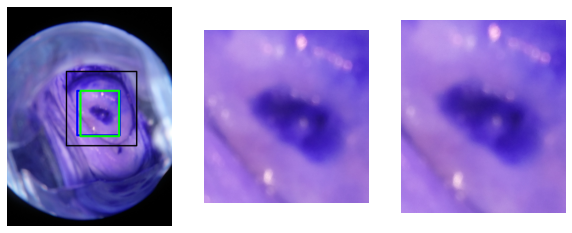

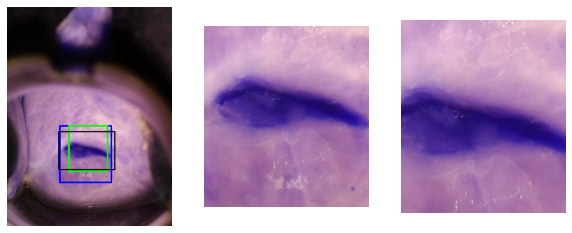

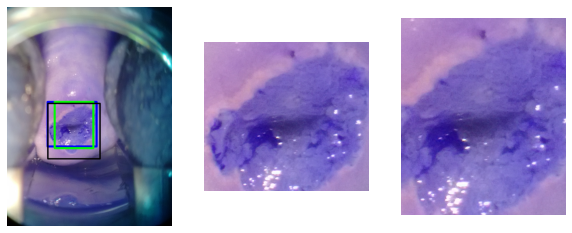

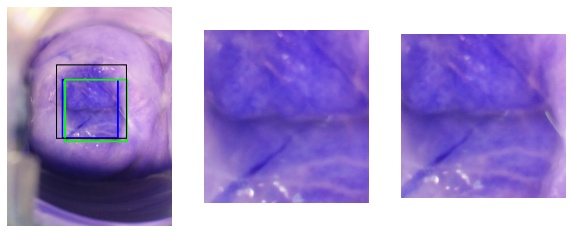

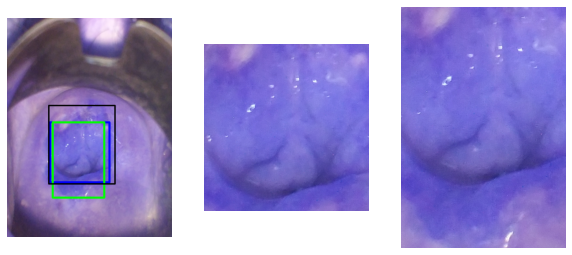

...

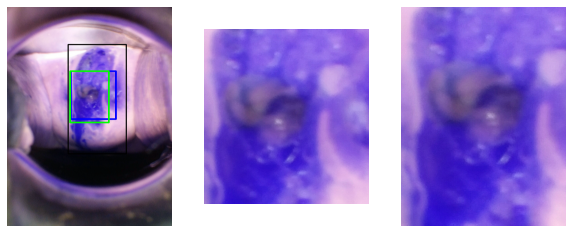

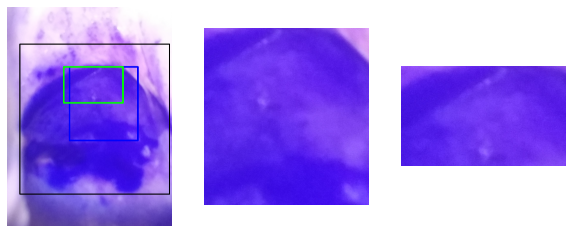

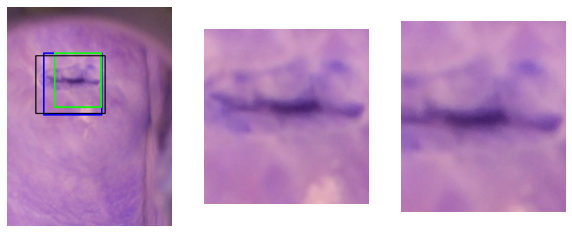

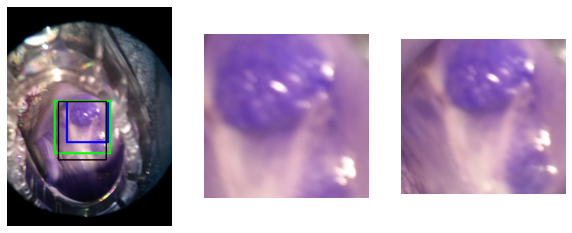

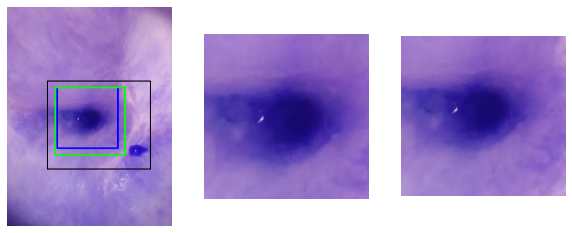

In [16]:
input_size = 512
iou1 = []
iou2 = []
output_size = input_size//stride
for count,test_image in enumerate(img_dirs[:100]):
    imagecv = cv2.imread(test_image)
    h,w = imagecv.shape[0],imagecv.shape[1]
    image = cv2.resize(imagecv,(input_size,input_size))
    fig,ax = plt.subplots(1,3,figsize=(10,10))
    bbox = bboxes[count]
    
    output = model1.predict(image.reshape(-1,input_size,input_size,3)/255)
    hm = output[:,:,:,0].reshape((1,output_size,output_size,1))
    reg = output[:,:,:,1:3]
    wh = output[:,:,:,3:]
    img_cpy = imagecv.copy()
    
    scores,detections = _ctdet_decode(hm, reg, wh, k=1, output_stride=2)
    temp=[bbox[0],bbox[1],int(bbox[0]+bbox[2]),int(bbox[1]+bbox[3])]
    imgcv_ = imagecv.copy()
    for i in range(len(detections)):
        
        #score = scores[i]
        detection = detections[i]
        xmin = detection[0]*(w/output_size)
        #xmin = xmin - (xmin//6)
        
        xmin = int(int(xmin>0)*xmin)
        if xmin>w:
            xmin = w
        ymin = detection[1]*(h/output_size)
        #ymin = ymin-(ymin//6)
        ymin = int(ymin*int(ymin>0))
        if ymin>h:
            ymin = h
        xmax = detection[2]*(w/output_size)
        #xmax = xmax+(xmax//6)
        xmax = int(xmax*int(xmax>0))
        if xmax>w:
            xmax = w
        ymax = detection[3]*(h/output_size)
        #ymax = ymax + (ymax//6)
        ymax = int(ymax*int(ymax>0))
        if ymax>h:
            ymax = h
        cv2.rectangle(imagecv,(xmin,ymin),(xmax,ymax),(0,0,255),30)


    ax[1].imshow(img_cpy[ymin:ymax,xmin:xmax])
    ax[1].axis("off")
    output = model2.predict(image.reshape(-1,input_size,input_size,3)/255)
    hm = output[:,:,:,0].reshape((1,output_size,output_size,1))
    reg = output[:,:,:,1:3]
    wh = output[:,:,:,3:]

    
    scores,detections = _ctdet_decode(hm, reg, wh, k=1, output_stride=2)
    
    for i in range(len(detections)):
        
        #score = scores[i]
        detection = detections[i]
        xmin = detection[0]*(w/output_size)
        #xmin = xmin - (xmin//6)
        
        xmin = int(int(xmin>0)*xmin)
        if xmin>w:
            xmin = w
        #ymin = detection[1]*(h/output_size)
        #ymin = ymin-(ymin//6)
        ymin = int(ymin*int(ymin>0))
        if ymin>h:
            ymin = h
        xmax = detection[2]*(w/output_size)
        #xmax = xmax+(xmax//6)
        xmax = int(xmax*int(xmax>0))
        if xmax>w:
            xmax = w
        ymax = detection[3]*(h/output_size)
        #ymax = ymax + (ymax//6)
        ymax = int(ymax*int(ymax>0))
        if ymax>h:
            ymax = h

        cv2.rectangle(imagecv,(xmin,ymin),(xmax,ymax),(0,255,0),30)
    cv2.rectangle(imagecv,(bbox[0],bbox[1]),(int(bbox[0]+bbox[2]),int(bbox[1]+bbox[3])),(0,0,0),20)
    ax[0].imshow(imagecv)
    ax[0].axis("off")
    ax[2].imshow(imgcv_[ymin:ymax,xmin:xmax])
    ax[2].axis("off")
    #print('{} done'.format(count))
    

In [ ]:
iou1.sort()
iou2.sort()

In [ ]:
sum(iou1[40:])

In [ ]:
sum(iou2[40:])